## Model for finding the shortest path for EVs:

Consider a network with undirected edges. We considered the nodes from the available charging stations in TX. Dijkstra's algorithm is used for finding shortest path between any two nodes.<br>
- For the first part, we include a constraint of $200 \geq$ arc-length $\leq 220$ miles into Dijkstra's algorithm when it tries to select its next node.
- For the second part, we include a constraint that arc-lenght $\leq 220$.

In [1]:
import networkx as nx
import numpy as np
import math
import pandas as pd
from geopy.distance import geodesic
import osmnx as ox
import pickle
import matplotlib.pyplot as plt
import time

def Networkx_data(file_path):
    
    # Bounding box coordinates
    north, south, east, west = 32.98591333323014, 32.6219673333468, -96.59428946560163, -97.10824000392094
    
    # Create network from bounding box
    G1 = ox.graph_from_bbox(north, south, east, west, network_type = 'drive', simplify = True)
    G2 = ox.utils_graph.get_largest_component(G1, strongly = True)
    
    # Read data from Excel file
    data_tx = pd.read_excel(file_path, index_col = 0)
    
    # Filter data based on bounding box
    filtered_df = data_tx[(data_tx['Latitude'] >= south) & (data_tx['Latitude'] <= north) &
                          (data_tx['Longitude'] >= west) & (data_tx['Longitude'] <= east)]
    
    filtered_df = filtered_df.drop(['congestion_points', 'total_vehicle_flow'], axis=1)
    filtered_df['predicted_demand_min'].fillna(0, inplace=True)
    
    # Initialize column to store nearest node OSM IDs
    filtered_df['closest_node_osmid'] = None
    
    # Find nearest node for each data point
    for index, row in filtered_df.iterrows():
        nearest_node = ox.distance.nearest_nodes(G2, X = row['Longitude'], Y = row['Latitude'])
        filtered_df.loc[index, 'closest_node_osmid'] = nearest_node
    
    # Save filtered data to Excel
    filtered_df.to_excel('data_DFW.xlsx', index = False)
    
    # Plot the graph with data points
#     fig, ax = plt.subplots(figsize = (27, 21))
    fig, ax = plt.subplots(figsize = (21, 15))
    ox.plot_graph(G2, node_color = "r", node_size = 3, show = False, close = False, ax = ax)
    for i in filtered_df['closest_node_osmid']:
        ax.scatter(G2.nodes[i]['x'], G2.nodes[i]['y'], c = 'blue', marker = 'o', s = 18, alpha = 1)
       
    return G2, filtered_df

In [2]:
def find_middle_element(arr):
    n = len(arr)
    if n % 2 == 0:  # Array length is even
        middle_index = n // 2 - 1
        middle_element = arr[middle_index]
        return middle_element
    else:  # Array length is odd
        middle_index = n // 2
        middle_element = arr[middle_index]
        return middle_element

In [3]:
def plot_graph_with_routes(G, shortest_path_routes_plot, common_nodes, filtered_df):
    
    # Following is a quick fix if there is only a single path in shortest_path_routes_plot
    if len(shortest_path_routes_plot) == 1:
        shortest_path_routes_plot = [shortest_path_routes_plot[0], shortest_path_routes_plot[0]]
        epoch = 2        
    else:
        epoch = 4
    
    # Plot the G network
#     fig, ax = ox.plot_graph(G, node_color = "green", node_size = 3, show = False, close = False, figsize = (27, 21), bgcolor='w')
    fig, ax = ox.plot_graph(G, node_color = "green", node_size = 3, show = False, close = False, figsize = (21, 15), bgcolor='w')

    # Plot the graph routes with specified parameters
    for offset in np.linspace(-1, 1, epoch):
        ox.plot_graph_routes(G, list(shortest_path_routes_plot), route_colors = "magenta", route_linewidth = 10, \
                             node_color = "r", node_size = 6, ax = ax, show = False, close = False, offset=offset)

    # Plot common nodes
    for i in common_nodes:
        ax.scatter(G.nodes[i]['x'], G.nodes[i]['y'], c = 'blue', marker = '^', s = 270)
        wait_time = filtered_df.loc[filtered_df['closest_node_osmid'] == i, 'predicted_demand_min'].iloc[0]
        
#         offset = 0.05      
        offset = 0
        ax.annotate("t_wait = " + str(int(wait_time)), (G.nodes[i]['x'] - offset, G.nodes[i]['y']), fontsize = 27, color = 'red', xytext = (-63, 18), textcoords = 'offset points')
        # Additional annotations with slight offsets to make it appear bright
        ax.annotate("t_wait = " + str(int(wait_time)).upper(), (G.nodes[i]['x'] - offset + 0.0001, G.nodes[i]['y'] + 0.0001), fontsize = 27, color = 'red', xytext = (-63, 18), textcoords = 'offset points')
        ax.annotate("t_wait = " + str(int(wait_time)).upper(), (G.nodes[i]['x'] - offset - 0.0001, G.nodes[i]['y'] - 0.0001), fontsize = 27, color = 'red', xytext = (-63, 18), textcoords = 'offset points')
        ax.annotate("t_wait = " + str(int(wait_time)).upper(), (G.nodes[i]['x'] - offset + 0.0001, G.nodes[i]['y'] - 0.0001), fontsize = 27, color = 'red', xytext = (-63, 18), textcoords = 'offset points')
        ax.annotate("t_wait = " + str(int(wait_time)).upper(), (G.nodes[i]['x'] - offset - 0.0001, G.nodes[i]['y'] + 0.0001), fontsize = 27, color = 'red', xytext = (-63, 18), textcoords = 'offset points')
        ax.annotate("t_wait = " + str(int(wait_time)).upper(), (G.nodes[i]['x'] - offset + 0.0002, G.nodes[i]['y'] + 0.0002), fontsize = 27, color = 'red', xytext = (-63, 18), textcoords = 'offset points')
        ax.annotate("t_wait = " + str(int(wait_time)).upper(), (G.nodes[i]['x'] - offset - 0.0002, G.nodes[i]['y'] - 0.0002), fontsize = 27, color = 'red', xytext = (-63, 18), textcoords = 'offset points')
        ax.annotate("t_wait = " + str(int(wait_time)).upper(), (G.nodes[i]['x'] - offset + 0.0002, G.nodes[i]['y'] - 0.0002), fontsize = 27, color = 'red', xytext = (-63, 18), textcoords = 'offset points')
        ax.annotate("t_wait = " + str(int(wait_time)).upper(), (G.nodes[i]['x'] - offset - 0.0002, G.nodes[i]['y'] + 0.0002), fontsize = 27, color = 'red', xytext = (-63, 18), textcoords = 'offset points')
        
    plt.show()

In [4]:
# def plot_large_graph_with_wait_time(G2, filtered_df):
#     # Plot the graph with doubled size
#     fig, ax = plt.subplots(figsize=(75, 66))

#     ox.plot_graph(G2, node_color="green", node_size=3, show=False, close=False, ax=ax)

#     for i in filtered_df['closest_node_osmid']:
#         ax.scatter(G2.nodes[i]['x'], G2.nodes[i]['y'], c='blue', marker='^', s=270)
#         wait_time = filtered_df.loc[filtered_df['closest_node_osmid'] == i, 'predicted_demand_min'].iloc[0]
#         offset = 0
#         ax.annotate("t_wait = " + str(int(wait_time)), 
#                     (G2.nodes[i]['x'] - offset, G2.nodes[i]['y']), 
#                     fontsize=27, color='red', xytext=(-63, 18), textcoords='offset points')
#         # Additional annotations with slight offsets to make it appear bright
#         ax.annotate("t_wait = " + str(int(wait_time)).upper(), 
#                     (G2.nodes[i]['x'] - offset + 0.00005, G2.nodes[i]['y'] + 0.00005), 
#                     fontsize=27, color='red', xytext=(-63, 18), textcoords='offset points')
#         ax.annotate("t_wait = " + str(int(wait_time)).upper(), 
#                     (G2.nodes[i]['x'] - offset - 0.00005, G2.nodes[i]['y'] - 0.00005), 
#                     fontsize=27, color='red', xytext=(-63, 18), textcoords='offset points')

#     plt.show()

In [5]:
def plot_large_graph_with_wait_time(G2, filtered_df):
    # Plot the graph with doubled size
    fig, ax = plt.subplots(figsize=(21, 15))

    ox.plot_graph(G2, node_color="green", node_size=3, show=False, close=False, ax=ax)

    for i in filtered_df['closest_node_osmid']:
        ax.scatter(G2.nodes[i]['x'], G2.nodes[i]['y'], c='blue', marker='^', s=270)
    
    for i in filtered_df['closest_node_osmid'][::15]:  # Select every 20th value of i
#         ax.scatter(G2.nodes[i]['x'], G2.nodes[i]['y'], c='blue', marker='^', s=270)
        wait_time = filtered_df.loc[filtered_df['closest_node_osmid'] == i, 'predicted_demand_min'].iloc[0]
        offset = 0
        ax.annotate("t_wait = " + str(int(wait_time)), 
                    (G2.nodes[i]['x'] - offset, G2.nodes[i]['y']), 
                    fontsize=27, color='red', xytext=(-63, 18), textcoords='offset points')
        # Additional annotations with slight offsets to make it appear bright
        ax.annotate("t_wait = " + str(int(wait_time)).upper(), 
                    (G2.nodes[i]['x'] - offset + 0.00005, G2.nodes[i]['y'] + 0.00005), 
                    fontsize=27, color='red', xytext=(-63, 18), textcoords='offset points')
        ax.annotate("t_wait = " + str(int(wait_time)).upper(), 
                    (G2.nodes[i]['x'] - offset - 0.00005, G2.nodes[i]['y'] - 0.00005), 
                    fontsize=27, color='red', xytext=(-63, 18), textcoords='offset points')

    plt.show()

In [6]:
def average_speed_meters_per_minute(G2):
    # Convert graph to GeoDataFrames
    gdf_nodes, gdf_edges = ox.graph_to_gdfs(G2)
    
    # Remove 'mph' from 'maxspeed' and convert to numeric
    gdf_edges['maxspeed'] = pd.to_numeric(gdf_edges['maxspeed'].str.replace('mph', ''), errors = 'coerce', downcast = 'integer')
    
    # Replace NaN with 0 and zero values with 30
    gdf_edges['maxspeed'].fillna(0, inplace = True)
    gdf_edges['maxspeed'] = gdf_edges['maxspeed'].replace(0, 30)
    
    # Calculate the mean value of 'maxspeed'
    mean_speed = gdf_edges['maxspeed'].mean()
    
    # Convert from miles per hour to meters per minute
    mean_speed_meter_mint = mean_speed * 1609.34 / 60
    
    return mean_speed_meter_mint

In [7]:
def update_graph_weighting_times(G2, filtered_df):    
    
#     avg_speed = average_speed_meters_per_minute(G2)
#     avg_speed = 100
#     avg_speed = 25

    avg_speed = 27 # avg_speed = 1 miles/hr
    
    length_eq_waits = []

    for _, row in filtered_df.iterrows():
        node_osmid = row['closest_node_osmid']
        wait_time = row['predicted_demand_min']
        # Calculate length_eq_waiting_time
        length_eq_waiting_time = wait_time * avg_speed
        edges_connected_to_node = list(G2.edges(node_osmid))
        # Change the weight of each edge connected to the node
        length_eq_waits.append(length_eq_waiting_time)
        for u, v in edges_connected_to_node:            
            old_length = G2[u][v][0]['length']
            G2[u][v][0]['length'] = old_length + length_eq_waiting_time
        
    filtered_df['length_eq_wait_time'] = length_eq_waits
            
    return G2, filtered_df

In [8]:
def longest_path_planning(G2, start_node_user, end_node_user, filtered_df, max_dist_allowed):

    drop = 0
    intermed_nodes_to_drop = [0]

    while intermed_nodes_to_drop:

        # Drop the selected edges from the graph
        for node in intermed_nodes_to_drop:
            if drop == 1:
                G2.remove_node(node)

        # Find shortest path between start and end nodes
        shortest_path = ox.shortest_path(G2, start_node_user, end_node_user, weight = "length")

    #     print(shortest_path)

        # Get closest node OSM IDs as numpy array
        nodes_array = filtered_df['closest_node_osmid'].to_numpy()

        # Get common nodes between shortest path and closest nodes
        common_nodes = [node for node in shortest_path if node in nodes_array]

        # Initialize dictionary to store shortest path lengths
        shortest_path_lengths = {}

        # Define an array to plot the routes
        shortest_path_routes_plot = []

        # Calculate shortest path lengths between common nodes
        for i in range(len(common_nodes) - 1):
            start_node = common_nodes[i]
            end_node = common_nodes[i + 1]
            shortest_path = ox.shortest_path(G2, start_node, end_node, weight = "length")
            shortest_path_routes_plot.append(shortest_path)
            shortest_path_length = sum(ox.utils_graph.get_route_edge_attributes(G2, shortest_path, "length"))
            
            eq_length = filtered_df.loc[filtered_df['closest_node_osmid'] == start_node, 'length_eq_wait_time'].values[0]\
                        + filtered_df.loc[filtered_df['closest_node_osmid'] == end_node, 'length_eq_wait_time'].values[0]
            
            shortest_path_length = shortest_path_length - eq_length
            
            shortest_path_lengths[find_middle_element(shortest_path)] = shortest_path_length 

        # Define an array to collect nodes to drop
        intermed_nodes_to_drop = []
        
        # Initialize a variable to display the length violated
        length_violated = 0
        
        # Enumerate over shortest_path_lengths dictionary
        for intermed_node, length in shortest_path_lengths.items():
            # Check if the length exceeds max_dist_allowed and the node is not the origin or destination
            if length > max_dist_allowed:
                intermed_nodes_to_drop.append(intermed_node)
                length_violated = length

        drop = 1

        print("Charging stations to be visited: ", common_nodes)
        print("maximum length violated: ", length_violated)
        plot_graph_with_routes(G2, shortest_path_routes_plot, common_nodes, filtered_df)
        print()
        
    return G2, shortest_path_routes_plot, common_nodes

C:\Users\HXK230065\AppData\Local\Temp\ipykernel_13316\2159649159.py:17: FutureWarning: The `north`, `south`, `east`, and `west` parameters are deprecated and will be removed in the v2.0.0 release. Use the `bbox` parameter instead.
  G1 = ox.graph_from_bbox(north, south, east, west, network_type = 'drive', simplify = True)


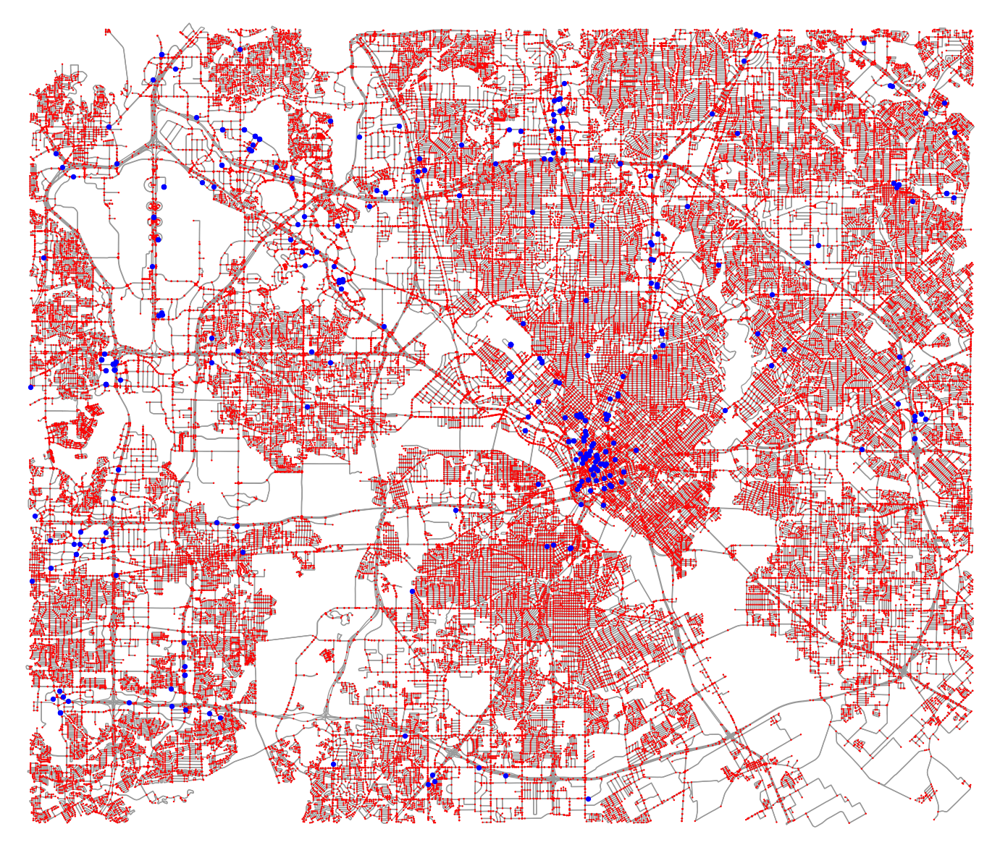

In [9]:
# FOLLOWING FOR A LARGE GRAPH: DFW area
start_node_user = 82349895
end_node_user = 6027959762
max_dist_allowed = 33000

# FOLLOWING FOR A SHORT GRAPH: smaller than DFW area
# start_node_user = 4194252169
# end_node_user = 82508235
# max_dist_allowed = 15000

G2, filtered_df = Networkx_data('data_tx_vehicleflow1.xlsx')

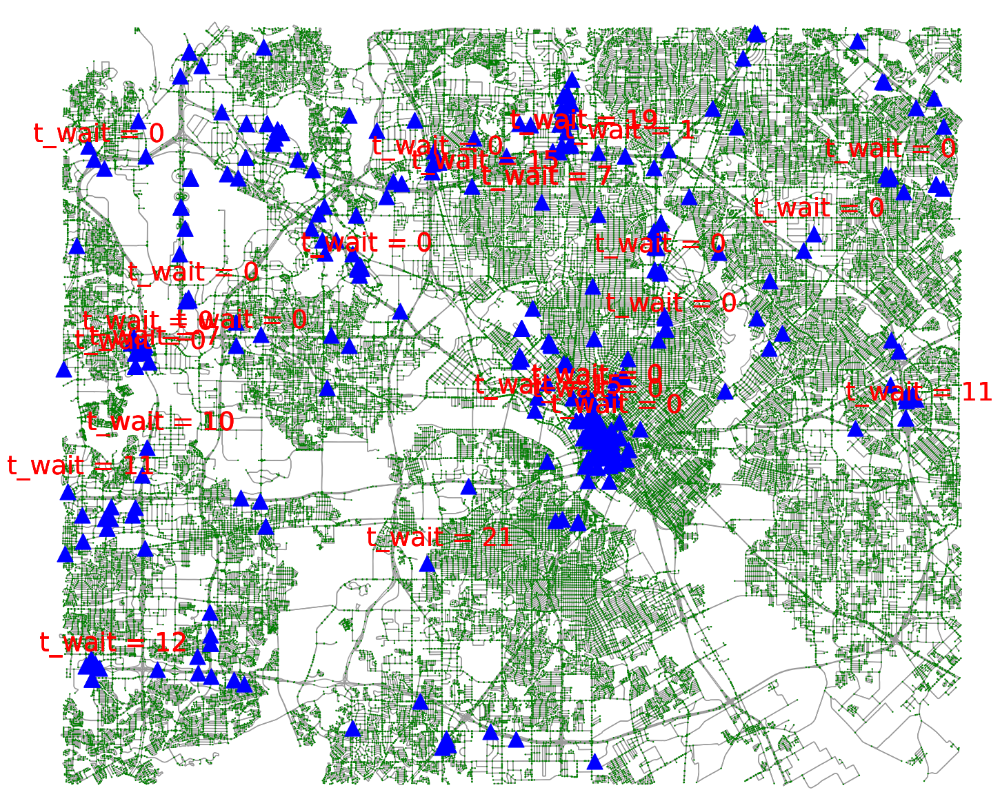

In [10]:
plot_large_graph_with_wait_time(G2, filtered_df)

In [11]:
G2, filtered_df = update_graph_weighting_times(G2, filtered_df)

C:\Users\HXK230065\AppData\Local\Temp\ipykernel_13316\1347407433.py:36: FutureWarning: The `get_route_edge_attributes` function has been deprecated and will be removed in the v2.0.0 release. Use the `route_to_gdf` function instead.
  shortest_path_length = sum(ox.utils_graph.get_route_edge_attributes(G2, shortest_path, "length"))


Charging stations to be visited:  [82349895, 81707211, 81756726, 81748898, 6027959762]
maximum length violated:  34469.656


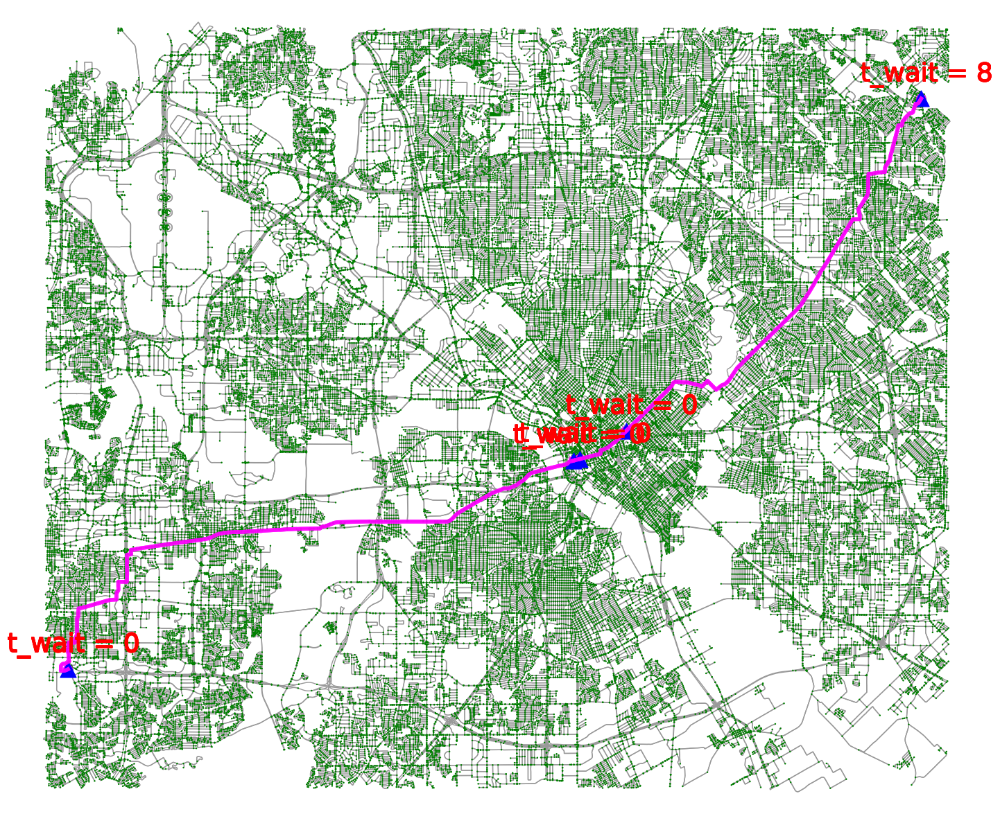

C:\Users\HXK230065\AppData\Local\Temp\ipykernel_13316\1347407433.py:36: FutureWarning: The `get_route_edge_attributes` function has been deprecated and will be removed in the v2.0.0 release. Use the `route_to_gdf` function instead.
  shortest_path_length = sum(ox.utils_graph.get_route_edge_attributes(G2, shortest_path, "length"))


Charging stations to be visited:  [82349895, 81707211, 81756726, 81748898, 6027959762]
maximum length violated:  34684.712


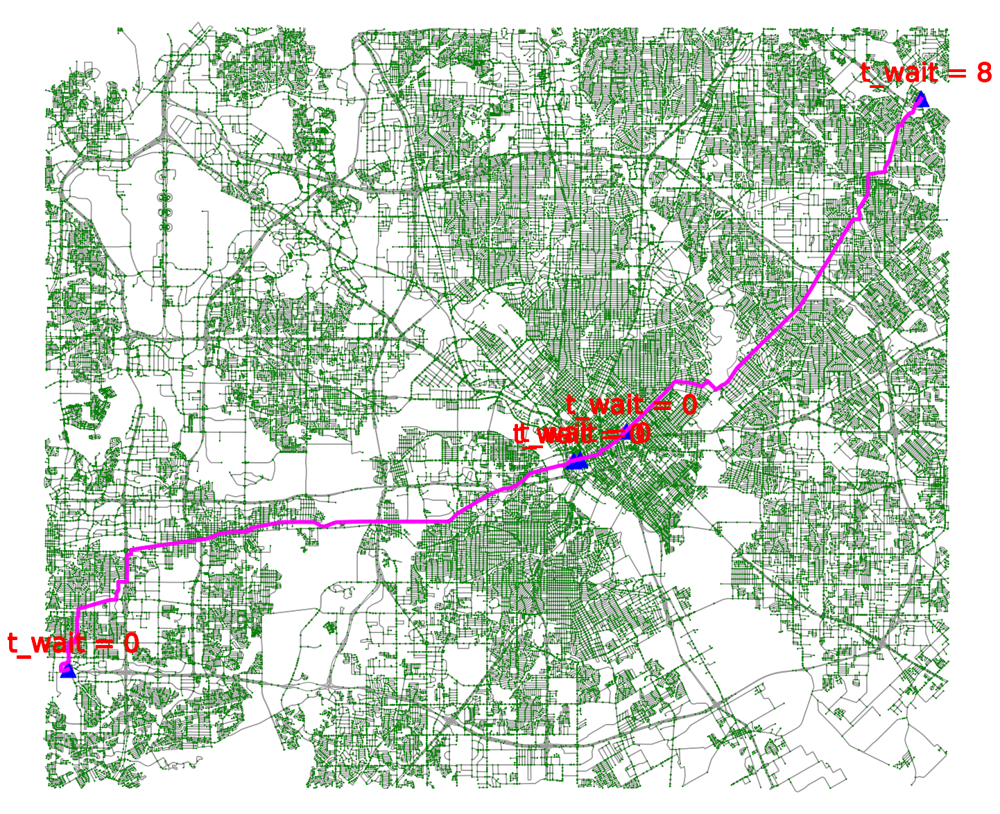

C:\Users\HXK230065\AppData\Local\Temp\ipykernel_13316\1347407433.py:36: FutureWarning: The `get_route_edge_attributes` function has been deprecated and will be removed in the v2.0.0 release. Use the `route_to_gdf` function instead.
  shortest_path_length = sum(ox.utils_graph.get_route_edge_attributes(G2, shortest_path, "length"))


Charging stations to be visited:  [82349895, 81748747, 6027959762]
maximum length violated:  43512.07425000001


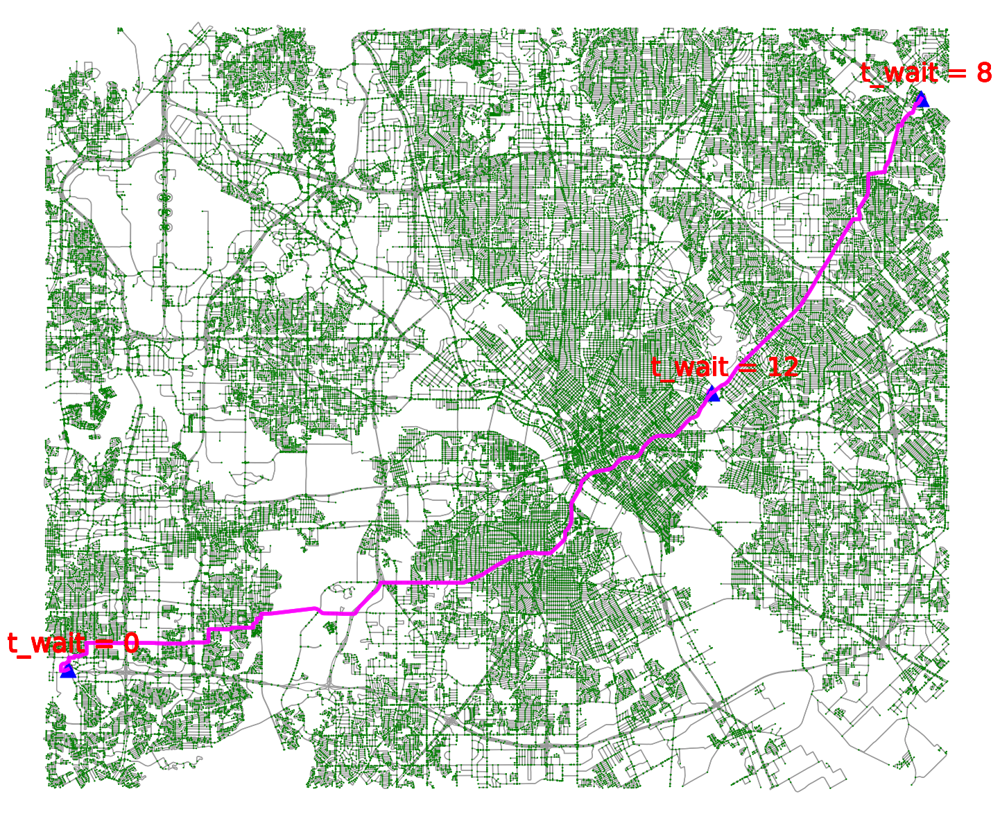

C:\Users\HXK230065\AppData\Local\Temp\ipykernel_13316\1347407433.py:36: FutureWarning: The `get_route_edge_attributes` function has been deprecated and will be removed in the v2.0.0 release. Use the `route_to_gdf` function instead.
  shortest_path_length = sum(ox.utils_graph.get_route_edge_attributes(G2, shortest_path, "length"))


Charging stations to be visited:  [82349895, 81707211, 81756726, 81748898, 6027959762]
maximum length violated:  34872.723


KeyboardInterrupt: 

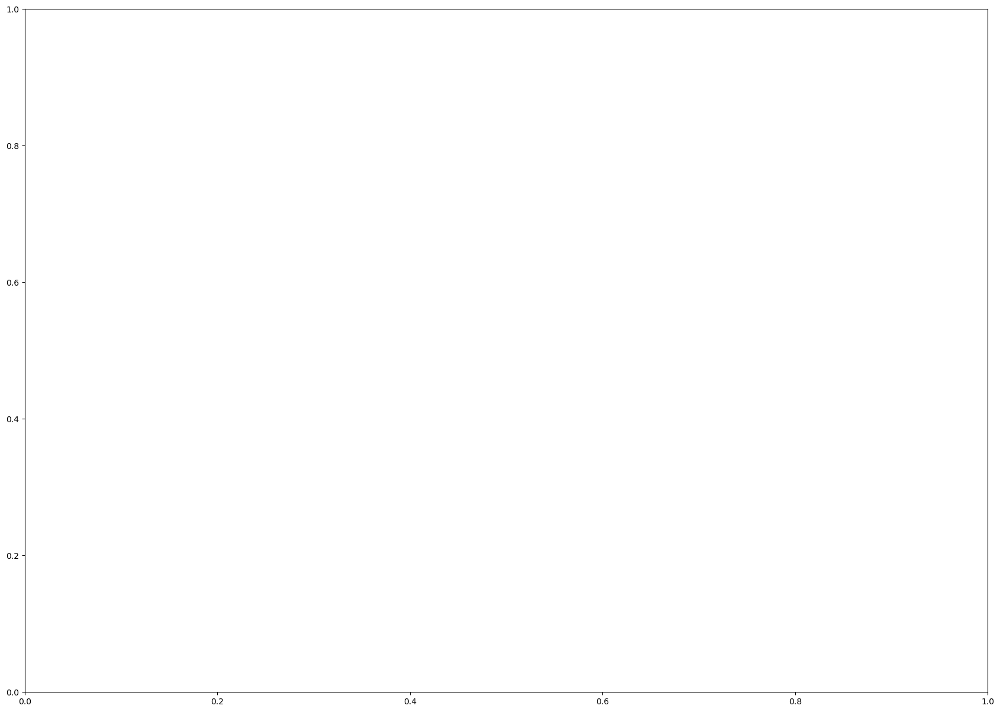

In [12]:
G2, shortest_path_routes_plot, common_nodes = longest_path_planning(G2, start_node_user, end_node_user, filtered_df, max_dist_allowed)

In [13]:
# plot_graph_with_routes(G2, shortest_path_routes_plot, common_nodes)

## References


In [14]:
###########################################
#### THIS TAKES INFINITELY LONG TIME!!!####
###########################################

# paths = nx.all_simple_paths(G2, source = Start_node_user, target = end_node_user, cutoff = 40)
# print(list(paths))